# Test BLIP Visual Question Answering

This notebook tests the BLIP VQA model on local images.

In [1]:
import sys
from pathlib import Path

# Add parent directory to path
sys.path.insert(0, str(Path.cwd().parent))

from PIL import Image
import torch
from transformers import BlipProcessor, BlipForQuestionAnswering

E:\Final Year Project\data_exploration_agent\backend\venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Load the BLIP model
print("Loading BLIP VQA model...")
processor = BlipProcessor.from_pretrained("Salesforce/blip-vqa-base")
model = BlipForQuestionAnswering.from_pretrained("Salesforce/blip-vqa-base")

# Move to GPU if available
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
print(f"✅ Model loaded on {device}")

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


Loading BLIP VQA model...
✅ Model loaded on cpu


Loading image: E:\Final Year Project\data_exploration_agent\backend\app\resource\images\img_0.jpg
✅ Image loaded: (5160, 850)


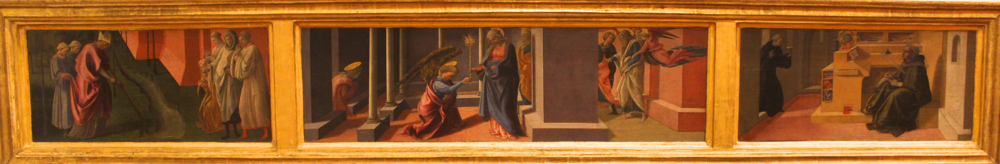

In [9]:
# Load the first image
image_path = Path.cwd().parent / "app" / "resource" / "images" / "img_0.jpg"
print(f"Loading image: {image_path}")

if not image_path.exists():
    print(f"❌ Image not found at {image_path}")
else:
    raw_image = Image.open(image_path).convert('RGB')
    print(f"✅ Image loaded: {raw_image.size}")
    display(raw_image)

In [10]:
# Ask a question about the image
question = "does the image depict war"

print(f"Question: {question}")
print("Processing...")

inputs = processor(raw_image, question, return_tensors="pt").to(device)

with torch.no_grad():
    out = model.generate(**inputs, max_length=50)

answer = processor.decode(out[0], skip_special_tokens=True)
print(f"\n✅ Answer: {answer}")

Question: does the image depict war, answer in 0 for no and 1 for yes?
Processing...

✅ Answer: yes


In [11]:
# Try different questions
questions = [
    "What colors are visible in this image?",
    "What is the art style?",
    "Is there a person in this image?",
    "What objects can you see?",
    "What is the mood of this artwork?"
]

print("Testing multiple questions:\n")
for q in questions:
    inputs = processor(raw_image, q, return_tensors="pt").to(device)
    
    with torch.no_grad():
        out = model.generate(**inputs, max_length=50)
    
    answer = processor.decode(out[0], skip_special_tokens=True)
    print(f"Q: {q}")
    print(f"A: {answer}\n")

Testing multiple questions:

Q: What colors are visible in this image?
A: red green yellow blue

Q: What is the art style?
A: modern

Q: Is there a person in this image?
A: no

Q: What objects can you see?
A: paintings

Q: What is the mood of this artwork?
A: calm



Testing question 'What is the main subject?' on multiple images:

img_0.jpg: painting


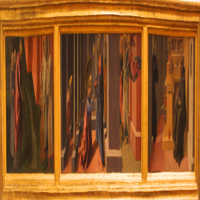

img_1.jpg: woman


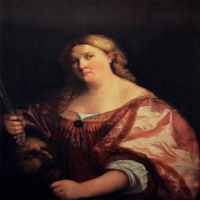

img_82.jpg: naked woman


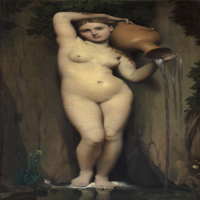

In [13]:
# Test with multiple images
images_dir = Path.cwd().parent / "app" / "resource" / "images"
test_images = ["img_0.jpg", "img_1.jpg", "img_82.jpg"]

question = "What is the main subject?"
print(f"Testing question '{question}' on multiple images:\n")

for img_name in test_images:
    img_path = images_dir / img_name
    if img_path.exists():
        img = Image.open(img_path).convert('RGB')
        
        inputs = processor(img, question, return_tensors="pt").to(device)
        
        with torch.no_grad():
            out = model.generate(**inputs, max_length=50)
        
        answer = processor.decode(out[0], skip_special_tokens=True)
        print(f"{img_name}: {answer}")
        display(img.resize((200, 200)))